##  Object Detection

## Template Matching on OpenCV

Template Matching is a method for searching and finding the location of a template image in a larger image. OpenCV comes with a function cv.matchTemplate() for this purpose. It simply slides the template image over the input image (as in 2D convolution) and compares the template and patch of input image under the template image. Several comparison methods are implemented in OpenCV. (You can check docs for more details). It returns a grayscale image, where each pixel denotes how much does the neighbourhood of that pixel match with template.

If input image is of size (WxH) and template image is of size (wxh), output image will have a size of (W-w+1, H-h+1). Once you got the result, you can use cv.minMaxLoc() function to find where is the maximum/minimum value. Take it as the top-left corner of rectangle and take (w,h) as width and height of the rectangle. That rectangle is your region of template.

- The template image simply slides over the input image (as in 2D convolution)
- The template and patch of input image under the template image are compared.
- The result obtained is compared with the threshold.
- If the result is greater than threshold, the portion will be marked as detected.
- In the function cv2.matchTemplate(img_gray,template,cv2.TM_CCOEFF_NORMED) the - first parameter is the mainimage, second parameter is the template to be matched and third parameter is the method used for matching.

First let's install the Geopandas and Rasterio

In [ ]:
!pip install rasterio

     |████████████████████████████████| 19.3 MB 1.3 MB/s 
     |████████████████████████████████| 994 kB 5.0 MB/s 
     |████████████████████████████████| 15.4 MB 36 kB/s 
     |████████████████████████████████| 6.6 MB 47.2 MB/s 


Let's Authenticate Google Drive:

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Import the necessary packages:

In [ ]:
import rasterio
import numpy as np
from matplotlib import pyplot as plt
import cv2

So let's open our test image and plot using matplotlib:

In [ ]:
path = '/content/drive/MyDrive/Datasets_CV/TL_UAV/Example2.tif'

In [ ]:
with rasterio.open(path) as src:
    im = src.read()

In [ ]:
im = im.transpose([1,2,0])

In [ ]:
im = im.astype('uint8')

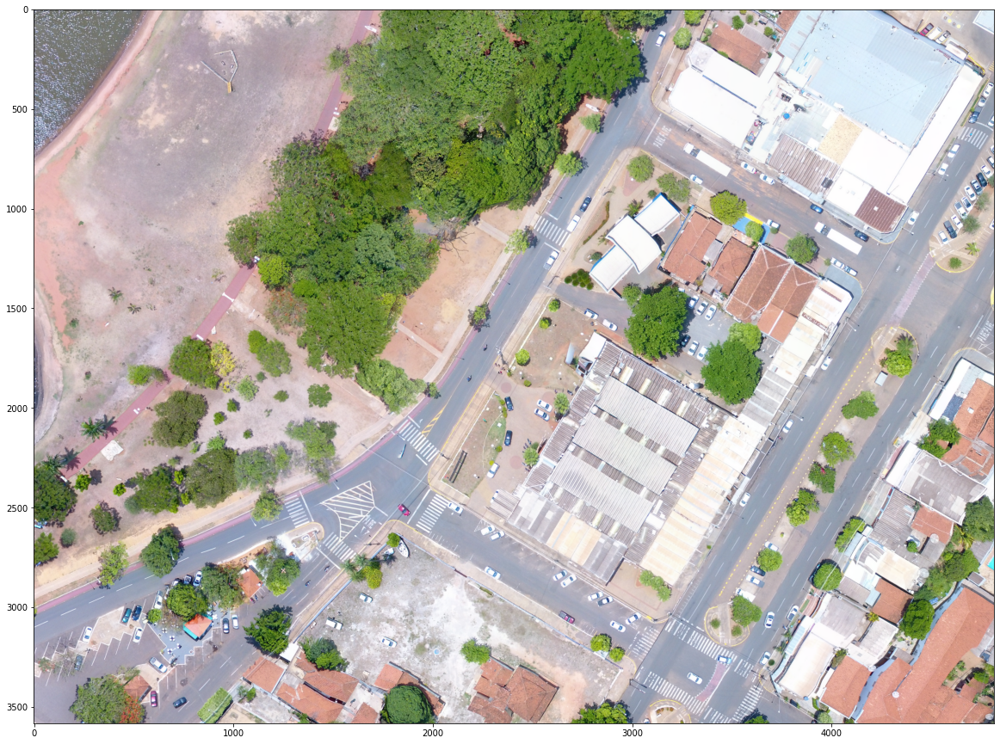

In [ ]:
plt.figure(figsize=[16,16])
plt.imshow(im)
plt.axis('off')

Now let's open our test template:

In [ ]:
path_car = '/content/drive/MyDrive/Datasets_CV/TL_UAV/car.tif'

In [ ]:
with rasterio.open(path_car) as src:
    im_car = src.read()

In [ ]:
im_car = im_car.transpose([1,2,0])

In [ ]:
im_car = im_car.astype('uint8')

This is an image of a car, taken from our larger test image:

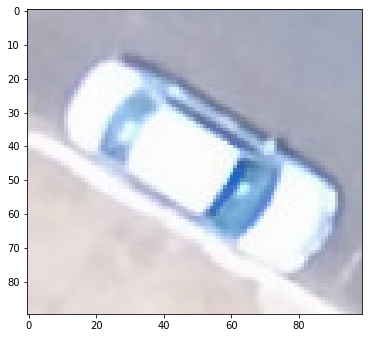

In [ ]:
plt.figure(figsize=[6,6])
plt.imshow(im_car)

So we want to identify where our template is in the original image.

First, we convert the template and image to grayscale:

In [ ]:
img_gray = cv2.cvtColor(im[:,:,0:3], cv2.COLOR_RGB2GRAY)
template = cv2.cvtColor(im_car[:,:,0:3], cv2.COLOR_RGB2GRAY)
w, h = template.shape[::-1]

And we use the cv2.matchTemplate function to find the specific location of the template in the image:

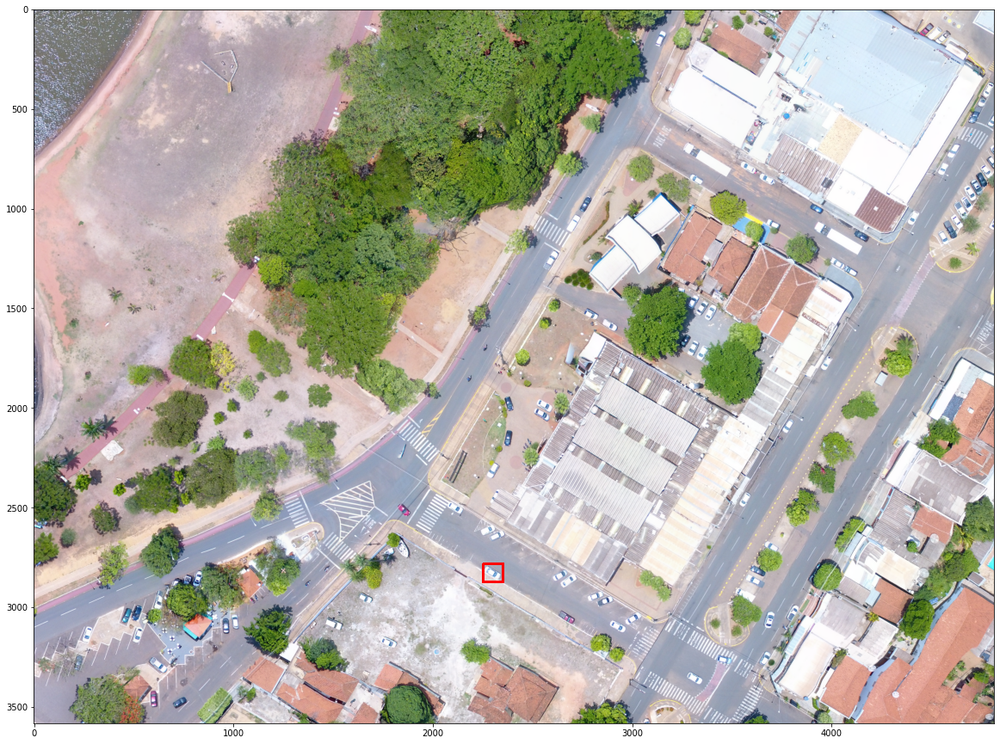

In [ ]:
plt.figure(figsize=[16,16])
plt.imshow(im)
plt.axis('off')
res = cv2.matchTemplate(img_gray,template,cv2.TM_CCOEFF_NORMED)
threshold = 0.7
loc = np.where( res >= threshold)
for pt in zip(*loc[::-1]):
    rect = plt.Rectangle((pt[0], pt[1]), w, h, edgecolor='r', facecolor='none')
    plt.gca().add_patch(rect)

## Multi Template matching on Skimage

No previous example performs the template that corresponds to an object. However, if the image contemplates similar objects, it is possible that we will be able to detect them. For this we will use a drone image of a citrus plantation, get the template of a single plant, and see if we can detect the other plants.

Let's start by opening the file and plotting the image:

In [ ]:
path = '/content/drive/MyDrive/Datasets_CV/droneRGB.tif'

In [ ]:
src = rasterio.open(path)

In [ ]:
img = src.read()

In [ ]:
img = img.transpose([1,2,0])

In [ ]:
img = img.astype('uint8')

(-0.5, 2705.5, 3003.5, -0.5)

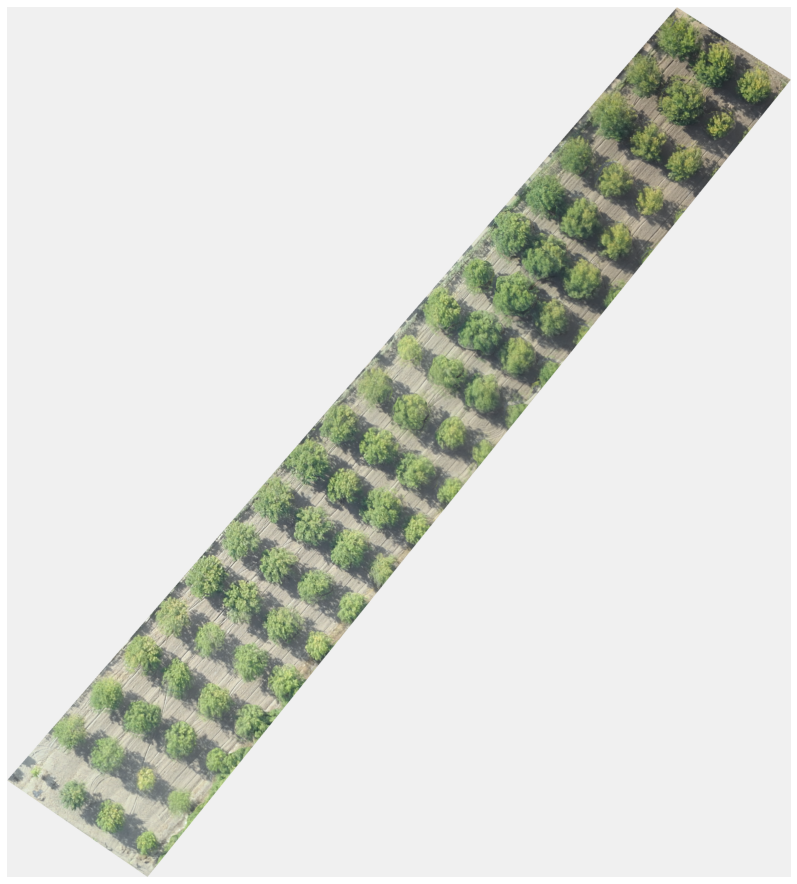

In [ ]:
plt.figure(figsize=[16,16])
plt.imshow(img)
plt.axis('off')

Now let's open our template:

In [ ]:
path = '/content/drive/MyDrive/Datasets_CV/tree.tif'

In [ ]:
src = rasterio.open(path)

In [ ]:
img_tree = src.read()

In [ ]:
img_tree = img_tree.transpose([1,2,0])

In [ ]:
img_tree = img_tree.astype('uint8')

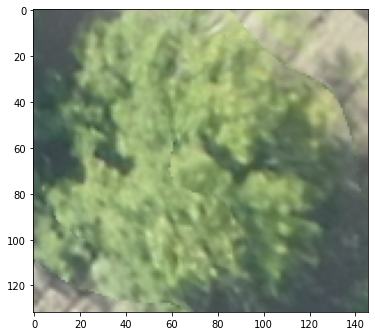

In [ ]:
plt.figure(figsize=[6,6])
plt.imshow(img_tree)

Let's just select the G-band of the RGB images:

In [ ]:
img_green = img[:,:,2]
template = img_tree[:,:,2]
w, h = template.shape[::-1]

Let's perform template matching with OpenCV and detect where our template is located:

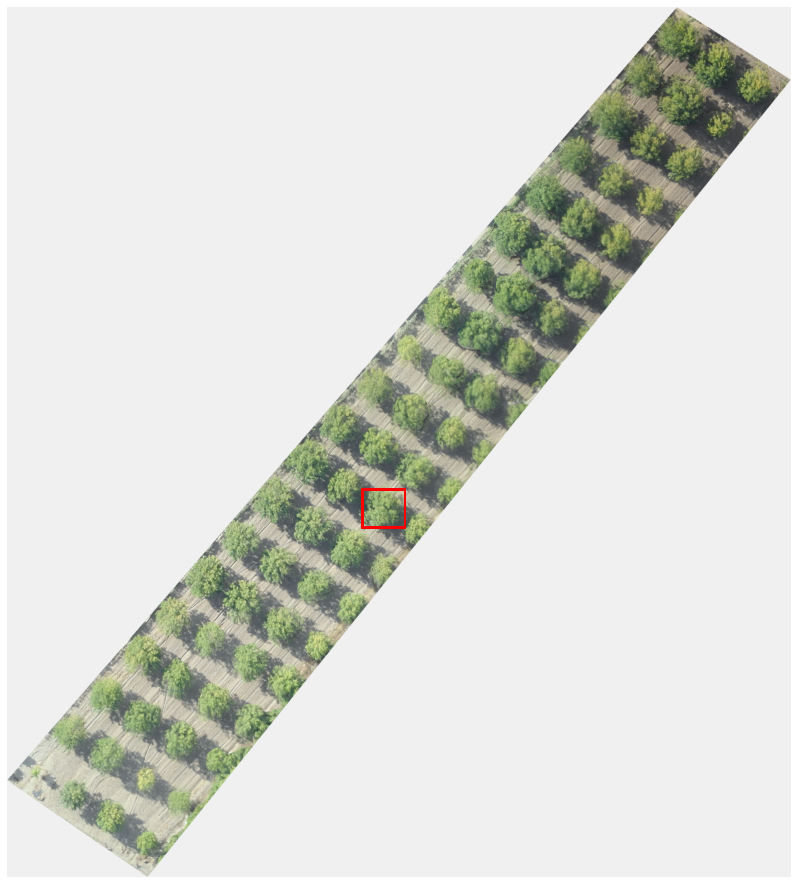

In [ ]:
plt.figure(figsize=[16,16])
plt.imshow(img)
plt.axis('off')
res = cv2.matchTemplate(img_green,template,cv2.TM_CCOEFF_NORMED)
threshold = 0.7
loc = np.where( res >= threshold)
for pt in zip(*loc[::-1]):
    #cv2.rectangle(im, pt, (pt[1] + w, pt[0] + h), (255,0,0), -1)
    rect = plt.Rectangle((pt[0], pt[1]), w, h, edgecolor='r', facecolor='none')
    plt.gca().add_patch(rect)

Let's now use the Skimage implementation. First we apply template matching. So we get the matching map, which demonstrates the most similar locations to our template:

In [ ]:
from skimage.feature import match_template
from skimage.feature import peak_local_max

In [ ]:
result = match_template(img_green, template)

In [ ]:
ij = np.unravel_index(np.argmax(result), result.shape)
x, y = ij[::-1]
hcoin, wcoin = template.shape

(-0.5, 2560.5, 2872.5, -0.5)

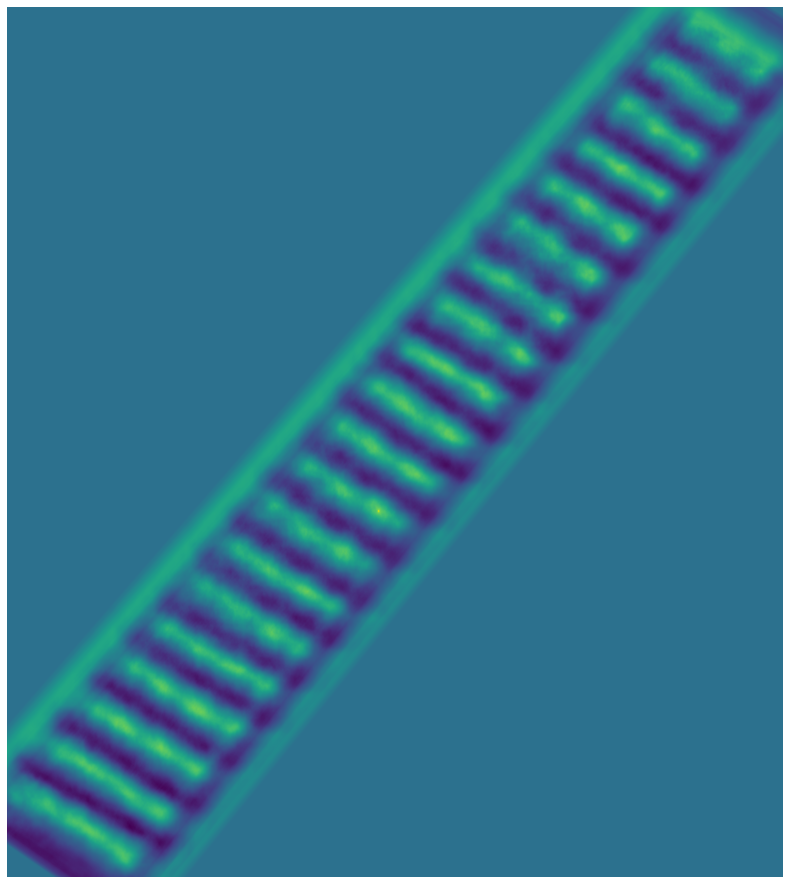

In [ ]:
plt.figure(figsize=[16,16])
plt.imshow(result)
plt.axis('off')

After plotting the map, we use the peak_local_max function to select the most similar locations:

In [ ]:
peaks = peak_local_max(result,min_distance=100,threshold_rel=0.4)

So we can see the detected coordinates:

In [ ]:
peaks

array([[2722,  274],
       [2598,  399],
       [2512,  276],
       [2447,  509],
       [2374,  386],
       [2328,  640],
       [2244,  509],
       [2188,  766],
       [2065,  873],
       [1930,  991],
       [1855,  862],
       [1797, 1108],
       [1664, 1226],
       [1593, 1106],
       [1542, 1352],
       [1456, 1214],
       [1408, 1448],
       [1323, 1318],
       [1276, 1572],
       [1189, 1444],
       [1145, 1692],
       [1049, 1570],
       [1023, 1818],
       [ 896, 1641],
       [ 873, 1924],
       [ 756, 2037],
       [ 652, 1915],
       [ 615, 2151],
       [ 531, 2024],
       [ 406, 2139],
       [ 216, 2203],
       [ 112, 2408]])

Finally we can plot the original image with the detections:

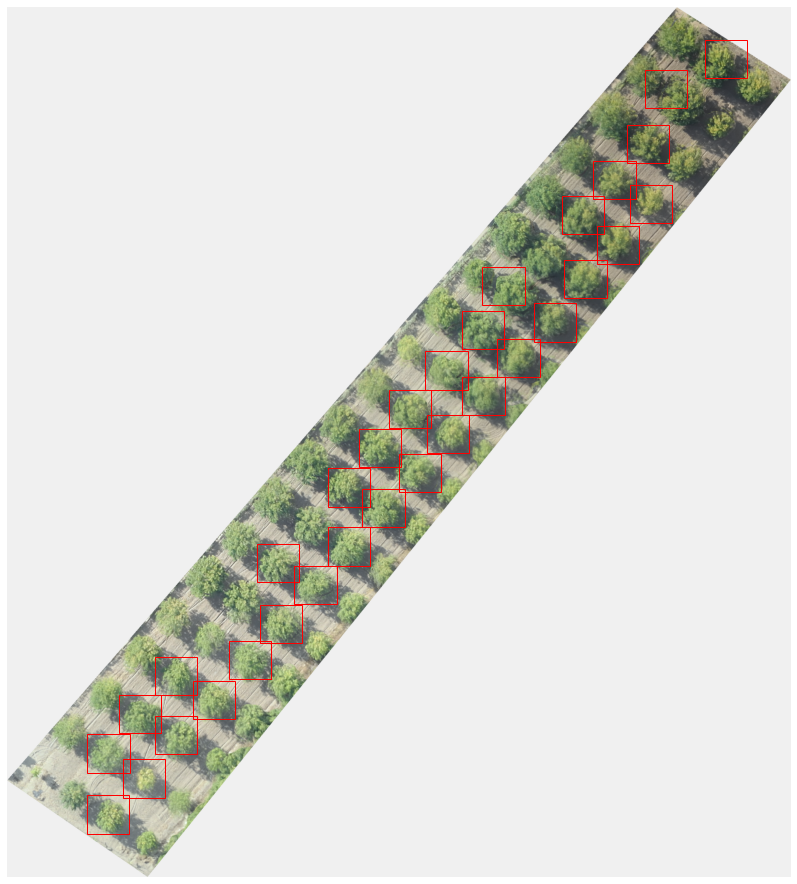

In [ ]:
plt.figure(figsize=[16,16])
plt.axis('off')
plt.imshow(img)
for y,x in peaks:
  rect = plt.Rectangle((x, y), w, h, edgecolor='r', facecolor='none')
  plt.gca().add_patch(rect)

## Object Detection with HOG + SVM

One of the most traditional and common approaches to object detection is the use of Histogram of Oriented Gradients together with the classifier SVM. The idea is to extract the characteristics with the HOG then create a classifier model using the SVM. The detection in the test image is done through a sliding window that goes through the image classifying each window with the model created in the previous step. Finally, NMS filters out the most exact boundarys.

Let's implement an example to detect cars in our drone image.

Our training image is very similar to the one used in the first example. In it we will collect points in QGIS that represented the cars and no-cars classes.

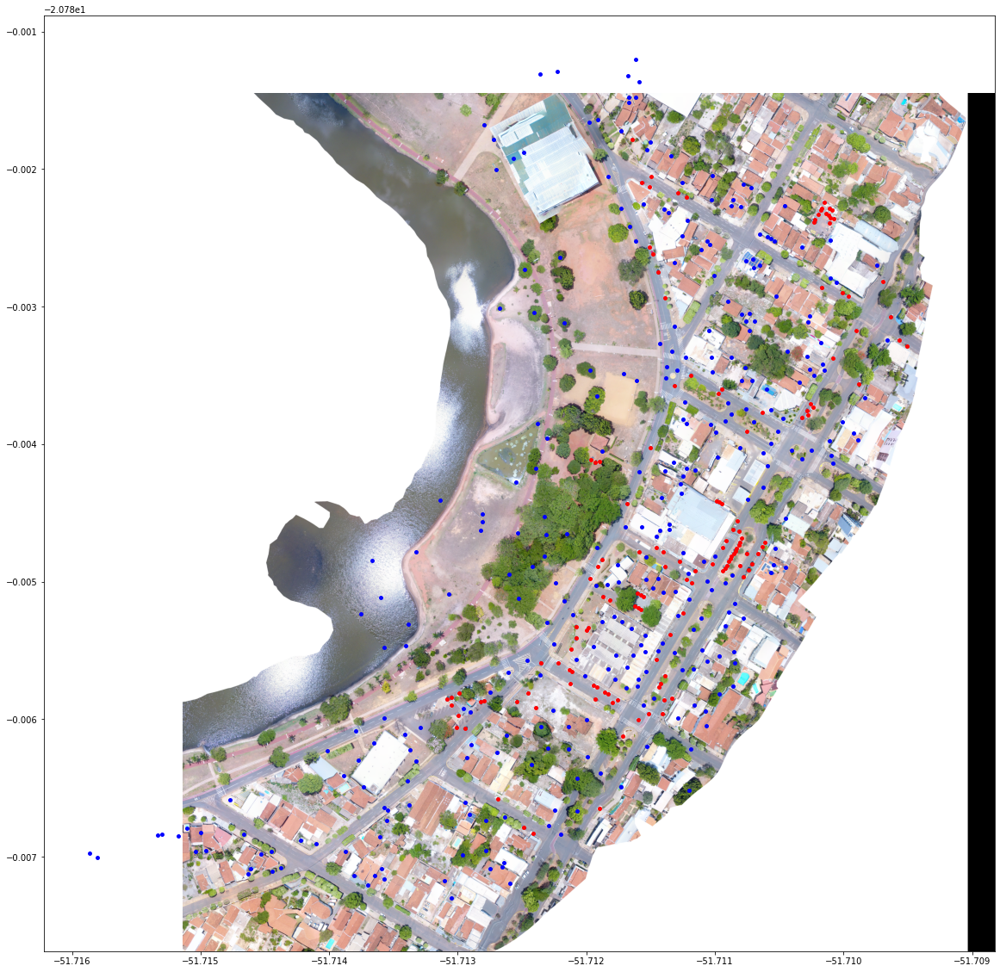

After the collection we will import our image:

In [ ]:
path = '/content/drive/MyDrive/Datasets_CV/Car_detection/L1_car_detect.tif'

In [ ]:
src = rasterio.open(path)
im = src.read()

In [ ]:
im = im.transpose([1,2,0])

In [ ]:
im.shape

(12715, 12104, 4)

Now let's import the required libraries:

In [ ]:
from shapely.geometry import shape
import geopandas as gpd
import shapely
from skimage import color
from skimage.feature import hog
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from skimage.feature import greycomatrix, greycoprops

Let's import the shapefiles with the points collected from each class:

In [ ]:
Cars = gpd.read_file('/content/drive/MyDrive/Datasets_CV/Car_detection/Cars.shp')
No_Cars = gpd.read_file('/content/drive/MyDrive/Datasets_CV/Car_detection/No_Cars.shp')

Let's create our dataset. From the collected points, we will generate an 80x80 pixel window, which will be the base size of our training images. We'll apply some data augmentation techniques, such as rotations and flips:

In [ ]:
Car_img_list = []
for car_point in Cars['geometry']:
  x = car_point.xy[0][0]
  y = car_point.xy[1][0]
  row, col = src.index(x,y)
  img_path = im[row-40:row+40,col-40:col+40,0:3]
  flipVertical  = cv2.flip(img_path, 0)
  flipHorizontal  = cv2.flip(img_path, 1)
  flipBoth = cv2.flip(img_path, -1)
  image90 = cv2.rotate(img_path, cv2.cv2.ROTATE_90_CLOCKWISE)
  rows,cols,_ = img_path.shape
  M = cv2.getRotationMatrix2D(((cols-1)/2.0,(rows-1)/2.0),45,1)
  dst = cv2.warpAffine(img_path,M,(cols,rows))

  Car_img_list.append(img_path)
  Car_img_list.append(flipVertical)
  Car_img_list.append(flipHorizontal)
  Car_img_list.append(flipBoth)
  Car_img_list.append(image90)
  Car_img_list.append(dst)

Car_img_list = np.array(Car_img_list)

In [ ]:
No_Car_img_list = []
for No_car_point in No_Cars['geometry']:
  x = No_car_point.xy[0][0]
  y = No_car_point.xy[1][0]
  row, col = src.index(x,y)
  img_path = im[row-40:row+40,col-40:col+40,0:3]
  flipVertical  = cv2.flip(img_path, 0)
  flipHorizontal  = cv2.flip(img_path, 1)
  flipBoth = cv2.flip(img_path, -1)
  image90 = cv2.rotate(img_path, cv2.cv2.ROTATE_90_CLOCKWISE)
  rows,cols,_ = img_path.shape
  M = cv2.getRotationMatrix2D(((cols-1)/2.0,(rows-1)/2.0),45,1)
  dst = cv2.warpAffine(img_path,M,(cols,rows))

  No_Car_img_list.append(img_path)
  No_Car_img_list.append(flipVertical)
  No_Car_img_list.append(flipHorizontal)
  No_Car_img_list.append(flipBoth)
  No_Car_img_list.append(image90)
  No_Car_img_list.append(dst)

No_Car_img_list = np.array(No_Car_img_list)

Here, we'll look at the size of our cars class image list and plot an example of each class:

In [ ]:
Car_img_list.shape

(852, 80, 80, 3)

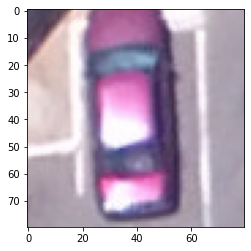

In [ ]:
plt.figure(figsize=[4,4])
plt.imshow(Car_img_list[6])

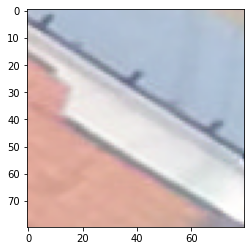

In [ ]:
plt.figure(figsize=[4,4])
plt.imshow(No_Car_img_list[0])

We can also plot the HOG of our displayed car class image:

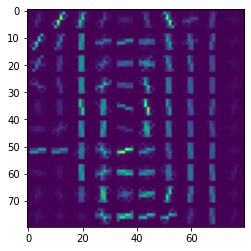

In [ ]:
fd, hog_image = hog(Car_img_list[6], orientations=8, pixels_per_cell=(8, 8),cells_per_block=(2, 2), visualize=True, multichannel=True)
plt.figure(figsize=[4,4])
plt.imshow(hog_image)

The next step is to apply HOG to our image lists.

In [ ]:
Car_hog_images = []
for image in Car_img_list:
    fd, hog_image = hog(image, orientations=8, pixels_per_cell=(8, 8),cells_per_block=(2, 2), visualize=True, multichannel=True)
    hog_image = hog_image.flatten()
    descriptor = np.transpose(hog_image[:,np.newaxis])
    Car_hog_images.append(descriptor)

In [ ]:
No_Car_hog_images = []
for image in No_Car_img_list:
    d, hog_image = hog(image, orientations=8, pixels_per_cell=(8, 8),cells_per_block=(2, 2), visualize=True, multichannel=True)
    hog_image = hog_image.flatten()
    descriptor = np.transpose(hog_image[:,np.newaxis])
    No_Car_hog_images.append(descriptor)

We will also create the vector of labels for each class:

In [ ]:
Y_car = np.ones(len(Car_hog_images))
Y_No_car = np.zeros(len(No_Car_hog_images))

In [ ]:
X_car = np.array(Car_hog_images)
X_No_car = np.array(No_Car_hog_images)

We concatenate the two classes:

In [ ]:
X = np.concatenate((X_car,X_No_car), axis=0)
Y = np.concatenate((Y_car,Y_No_car), axis=0)

We convert the HOG image into a feature vector. As a result we will have a vector of 6400 features (80x80):

In [ ]:
X = X.reshape(X.shape[0],X.shape[1]*X.shape[2])

So we can separate the images into training and test data, create the classifier, train it and check the accuracy of this generated model:

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.3, random_state = 42)

In [ ]:
clf = svm.SVC(C=100.0)

In [ ]:
clf.fit(X_train,Y_train)

SVC(C=100.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [ ]:
y_pred=clf.predict(X_test)

In [ ]:
print('Accuracy: ', accuracy_score(Y_test, y_pred))

Accuracy:  0.9581839904420549


In [ ]:
print(classification_report(Y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.97      0.97      0.97       583
         1.0       0.93      0.94      0.93       254

    accuracy                           0.96       837
   macro avg       0.95      0.95      0.95       837
weighted avg       0.96      0.96      0.96       837



Obtaining a good accuracy we can go to the detection step in a new image.

First, let's create some auxiliary functions:

In [ ]:
def resize(image, width=None, height=None, inter=cv2.INTER_AREA):
	dim = None
	(h, w) = image.shape[:2]
	if width is None and height is None:
		return image
	if width is None:
		r = height / float(h)
		dim = (int(w * r), height)
	else:
		r = width / float(w)
		dim = (width, int(h * r))
	resized = cv2.resize(image, dim, interpolation=inter)
	return resized

In [ ]:
def pyramid(image, scale=1.5, minSize=(30, 30)):
	yield image
	while True:
		w = int(image.shape[1] / scale)
		image = resize(image, width=w)
		if image.shape[0] < minSize[1] or image.shape[1] < minSize[0]:
			break
		yield image

def sliding_window(image, stepSize, windowSize):
	for y in range(0, image.shape[0], stepSize):
		for x in range(0, image.shape[1], stepSize):
			yield (x, y, image[y:y + windowSize[1], x:x + windowSize[0]])

We can import our test image:

In [ ]:
test_path = '/content/drive/MyDrive/Datasets_CV/Car_detection/Example_cars_detect.tif'

In [ ]:
src_test = rasterio.open(test_path)
im_test = src_test.read()

In [ ]:
im_test = im_test.transpose([1,2,0])

In [ ]:
im_test = im_test.astype('uint8')

In [ ]:
image = im_test[:,:,0:3]

Let's set the parameters and apply the sliding window to our image. If the model detects cars in the window, the limit for that window is added to the list of bboxes:

In [ ]:
scale = 1
minSize = (4000, 4000)
# Sliding window parameters
stepSize = 20
(winW, winH) = (80, 80)

In [ ]:
bboxes = np.zeros(4,np.int64)
for i, resized in enumerate(pyramid(image, scale=scale, minSize=minSize)):
  for (x, y, window) in sliding_window(resized, stepSize=stepSize, windowSize=(winW, winH)):
    if (window.shape[0] == winH and window.shape[1] == winW):
      clone = resized.copy()
      #cv2.rectangle(clone, (x, y), (x + winW, y + winH), (0, 255, 0), 2)
      cropped_img = resized[y:y + winH, x:x + winW]
      fd,hog_image = hog(cropped_img, orientations=8, pixels_per_cell=(8, 8),cells_per_block=(2, 2), visualize=True, multichannel=True)
      descriptor = hog_image.flatten()[np.newaxis,:]
      y_pred = clf.predict(descriptor)



      if y_pred == 1:
        print('detected')
        if i != 0:
          bboxes = np.vstack((bboxes, np.array([
            int(x*scale*i), int(y*scale*i),
            int((x + winW)*scale*i), int((y + winH)*scale*i)])))
        else:
          bboxes = np.vstack((bboxes, np.array([
            int(x),int(y),int(x + winW), int(y + winH)])))




detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected
detected


Let's plot the results:

In [ ]:
bboxes = np.delete(bboxes, (0), axis=0)

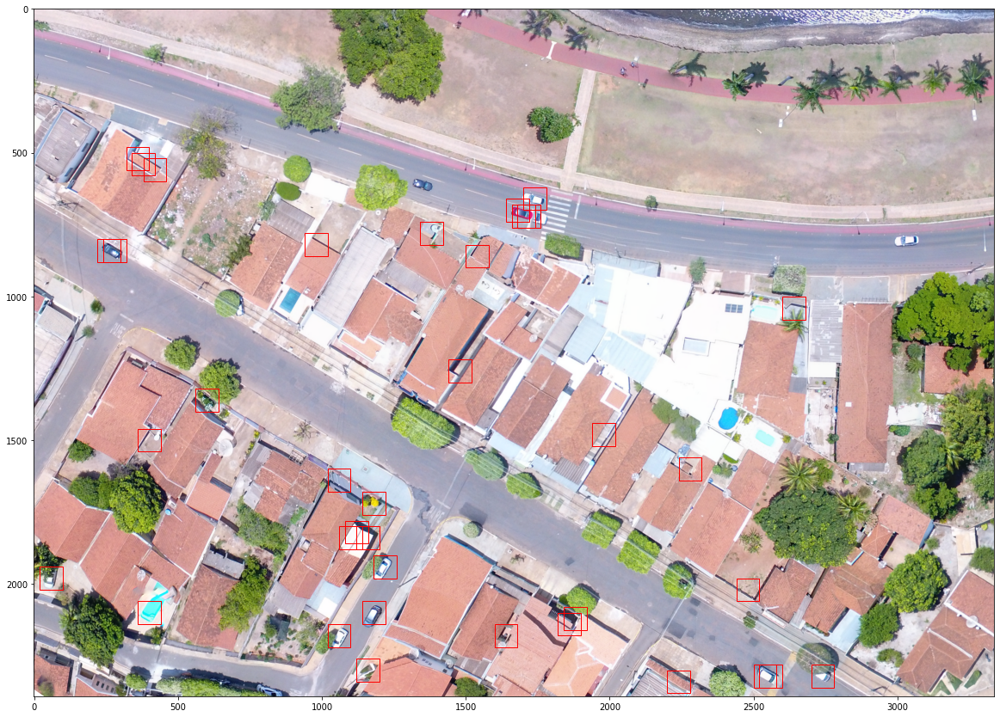

In [ ]:
plt.figure(figsize=[20,20])
plt.imshow(im_test)
for box in bboxes:
  rect = plt.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1], edgecolor='r', facecolor='none')
  plt.gca().add_patch(rect)

We saw that we have regions with several bboxes close to each other. Let's use non maximum suppression to remove imprecise detections from the same region:

In [ ]:
def non_max_suppression_fast(boxes, overlapThresh):
	'''
	This function performs non maximal supression over a set of bounding boxes
	where the resulting boxes contain most of the information of the initial
	boxes.
	Args:
		boxes(numpy.array): Set of bounding boxes of shape=(None,4).
		overlapThresh(float): Supression threshold for the overlapped area
		between boxes.
	Returns:
		boxes(numpy.array): Resulting boxes after performing the NMS of
		shape=(None,4).
	'''

	if len(boxes) == 0:
		return []

	if boxes.dtype.kind == "i":
		boxes = boxes.astype("float")


	pick = []


	x1 = boxes[:,0]
	y1 = boxes[:,1]
	x2 = boxes[:,2]
	y2 = boxes[:,3]

	area = (x2 - x1 + 1) * (y2 - y1 + 1)
	idxs = np.argsort(y2)

	while len(idxs) > 0:
		last = len(idxs) - 1
		i = idxs[last]
		pick.append(i)

		xx1 = np.maximum(x1[i], x1[idxs[:last]])
		yy1 = np.maximum(y1[i], y1[idxs[:last]])
		xx2 = np.minimum(x2[i], x2[idxs[:last]])
		yy2 = np.minimum(y2[i], y2[idxs[:last]])

		# compute the width and height of the bounding box
		w = np.maximum(0, xx2 - xx1 + 1)
		h = np.maximum(0, yy2 - yy1 + 1)

		overlap = (w * h) / area[idxs[:last]]

		idxs = np.delete(idxs, np.concatenate(([last],
			np.where(overlap > overlapThresh)[0])))

	return boxes[pick].astype("int")

In [ ]:
nms_bboxes = non_max_suppression_fast(bboxes, 0.3)

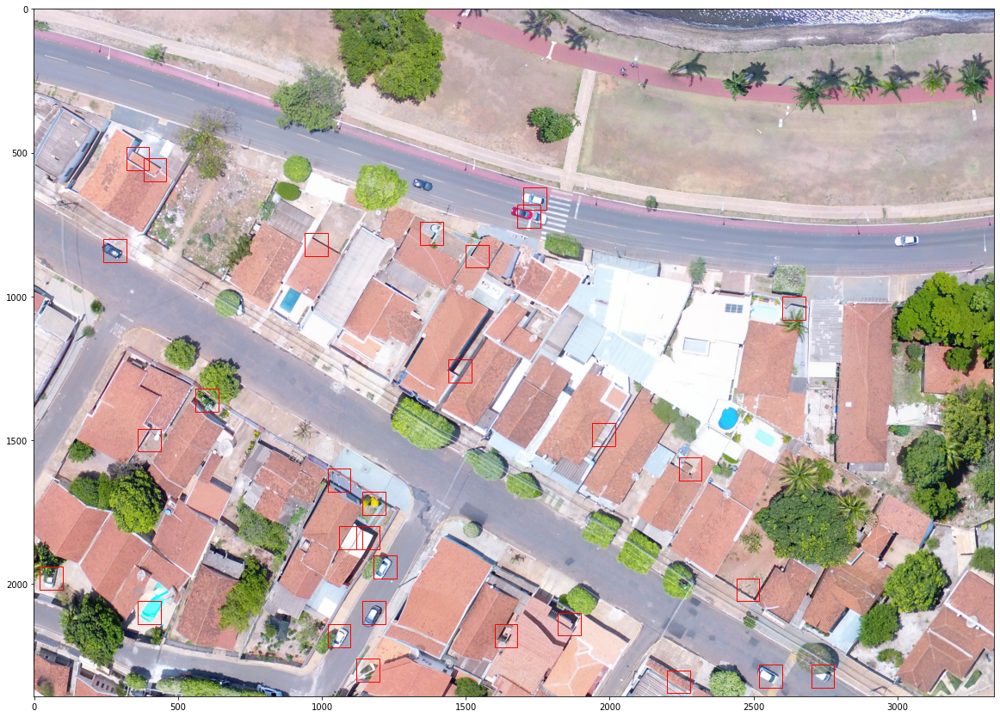

In [ ]:
plt.figure(figsize=[20,20])
plt.imshow(im_test)
for box in nms_bboxes:
  rect = plt.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1], edgecolor='r', facecolor='none')
  plt.gca().add_patch(rect)

References:

https://docs.opencv.org/4.5.2/d4/dc6/tutorial_py_template_matching.html

https://www.geeksforgeeks.org/template-matching-using-opencv-in-python/

https://github.com/lmzh123/ships_detection

https://machinelearningknowledge.ai/different-types-of-object-detection-algorithms/#Traditional_Approach